# pyCisTopic scATAC processing

In [1]:
import pycisTopic
import pandas as pd
import os
pycisTopic.__version__

'2.0a0'

In [2]:
!ls 

01_subset_cistopic.ipynb       03_pycistopic_post_modelling.ipynb  outs
02_pycistopic_modelling.py     dar_chr7_visualisation.ipynb
02_pycistopic_modelling.slurm  logs


In [ ]:
!pwd

In [4]:
os.chdir(os.getcwd())

# Once the cistopic modeling is finished

In [ ]:
! cat logs/R-cistopic_modelling.*.out

In [7]:
import pickle
file_path = os.path.join(os.getcwd(), "outs/subset_cistopic_obj.pkl")
with open(file_path, 'rb') as file:
    cistopic_obj = pickle.load(file)

print(cistopic_obj)

CistopicObject from project cisTopic_merge with n_cells × n_regions = 6314 × 190229


In [8]:
cistopic_obj.cell_data

,barcode_rank,fraction_of_fragments_in_peaks,cisTopic_nr_acc,log10_unique_fragments_count,duplication_count,tss_enrichment,cisTopic_log_nr_acc,pdf_values_for_duplication_ratio,cisTopic_nr_frag,pdf_values_for_tss_enrichment,...,cell_type,sample_id,pycisTopic_leiden_10_0.2,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_1.2,pycisTopic_leiden_10_3,pycisTopic_leiden_10_6,is_nan,cell_type_all
CACGGTTTCGTTAGTT-D0___D0,1118,0.681807,5172,3.910998,2353,18.499067,3.713659,21.064461,5971,0.046020,...,Pro-B_cells_D0,D0,1,1,1,6,17,35,False,Pro-B_cells_D0
AAGTGAACATTGTGAG-D0___D0,1130,0.720803,5523,3.904391,2315,17.083343,3.742175,20.992568,6296,0.046662,...,Pro-B_cells_D0,D0,1,1,1,5,16,46,False,Pro-B_cells_D0
ACAGCACCAAAGGTAA-D0___D0,930,0.691150,7075,4.039850,3157,16.882171,3.849726,20.009237,8168,0.046648,...,Pro-B_cells_D0,D0,1,1,1,6,17,5,False,Pro-B_cells_D0
ACCCTTAAGCTTTACG-D0___D0,705,0.638976,8644,4.175048,4365,17.290009,3.936715,19.926356,10340,0.044649,...,Pro-B_cells_D0,D0,3,4,5,12,26,69,False,Pro-B_cells_D0
AAACAAGCAGCCAATA-D0___D0,309,0.644992,16331,4.494433,9384,18.872742,4.213013,10.304192,21699,0.017207,...,Pro-B_cells_D0,D0,3,4,5,12,26,69,False,Pro-B_cells_D0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AATCGTTTCTCAAGAA-Q1___Q1,5109,0.740272,1535,3.313234,371,22.704900,3.186108,32.307821,1641,0.016111,...,Pro-B_cells_Q1,Q1,0,0,0,0,15,3,False,Pro-B_cells_Q1
CTTCCTCCATAACCGA-Q1___Q1,6161,0.751458,1023,3.137671,256,21.475985,3.009876,16.906170,1115,0.017699,...,NaN,Q1,0,0,0,3,15,34,True,Pro-B_cells_Q1
CGGTGTGCATGACTTC-Q1___Q1,5825,0.742784,1151,3.193125,247,18.912097,3.061075,11.904044,1238,0.035260,...,Pro-B_cells_Q1,Q1,0,0,0,0,7,42,False,Pro-B_cells_Q1
ACAGCGGGTGCTTCCT-Q1___Q1,5887,0.746544,1127,3.181844,278,20.926997,3.051924,22.265735,1224,0.021729,...,Pro-B_cells_Q1,Q1,0,0,0,0,7,31,False,Pro-B_cells_Q1


In [9]:
file_path = os.path.join(os.getcwd(),"outs/models.pkl")
with open(file_path, 'rb') as file:
    models = pickle.load(file)

print(models)

/opt/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-07-10 15:30:11,615	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


[<pycisTopic.lda_models.CistopicLDAModel object at 0x14981eb2fe90>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1497e49498d0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1497e4950c50>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1497e4960310>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1497e4963b10>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1497e496f3d0>, <pycisTopic.lda_models.CistopicLDAModel object at 0x1497e4972f10>]


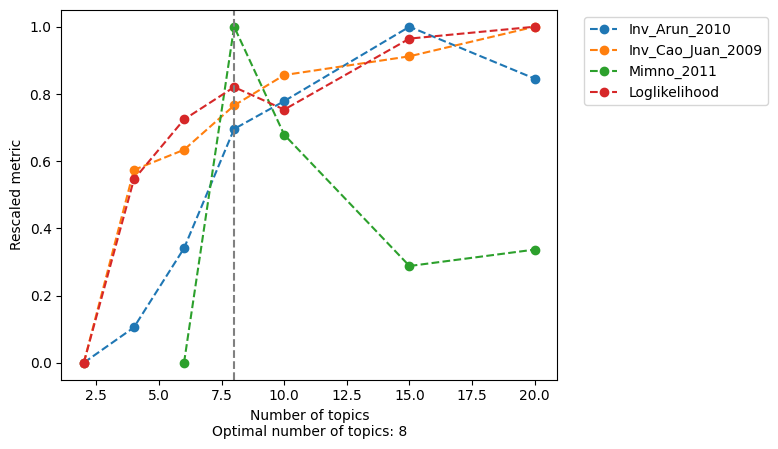

In [12]:
from pycisTopic.lda_models import evaluate_models
model = evaluate_models(
    models,
    select_model = 8,
    return_model = True
)

choosing model with 8 topics 

In [13]:
cistopic_obj.add_LDA_model(model)

In [14]:
out_dir = "outs"
os.makedirs(out_dir, exist_ok = True)

In [15]:
out_dir

'outs'

In [16]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "subset_cistopic_obj_all_info.pkl"), "wb")
)

# Clustering and visualisation

In [17]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

In [18]:
find_clusters(
    cistopic_obj,
    target  = 'cell',
    k = 10,
    res = [0.2,0.3,0.6, 1.2, 3,6],
    prefix = 'pycisTopic_',
    scale = True,
    split_pattern = '-'
)

2025-07-10 15:30:58,050 cisTopic     INFO     Finding neighbours
Columns ['pycisTopic_leiden_10_0.2'] will be overwritten
Columns ['pycisTopic_leiden_10_0.3'] will be overwritten
Columns ['pycisTopic_leiden_10_0.6'] will be overwritten
Columns ['pycisTopic_leiden_10_1.2'] will be overwritten
Columns ['pycisTopic_leiden_10_3'] will be overwritten
Columns ['pycisTopic_leiden_10_6'] will be overwritten


In [19]:
cistopic_obj.cell_data

,log10_total_fragments_count,cisTopic_log_nr_frag,pycisTopic_leiden_10_1.2,pdf_values_for_duplication_ratio,barcode,pycisTopic_leiden_10_0.6,log10_unique_fragments_in_peaks_count,duplication_count,cisTopic_nr_frag,cisTopic_nr_acc,...,unique_fragments_count,pdf_values_for_fraction_of_fragments_in_peaks,doublet_outlier,pycisTopic_leiden_10_3,total_fragments_in_peaks_count,pdf_values_for_tss_enrichment,doublets_atac,total_fragments_count,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_6
CACGGTTTCGTTAGTT-D0___D0,4.021189,3.776047,15,21.064461,CACGGTTTCGTTAGTT,0,3.744684,2353,5971,5172,...,8146,2.605138,False,24,7136,0.046020,False,10499,2,5
AAGTGAACATTGTGAG-D0___D0,4.014479,3.799065,5,20.992568,AAGTGAACATTGTGAG,0,3.762228,2315,6296,5523,...,8023,2.586099,False,19,7451,0.046662,False,10338,2,29
ACAGCACCAAAGGTAA-D0___D0,4.149773,3.912116,15,20.009237,ACAGCACCAAAGGTAA,0,3.879440,3157,8168,7075,...,10960,2.452357,False,42,9740,0.046648,False,14117,2,17
ACCCTTAAGCTTTACG-D0___D0,4.286209,4.014521,10,19.926356,ACCCTTAAGCTTTACG,6,3.980549,4365,10340,8644,...,14963,2.296545,False,39,12338,0.044649,False,19328,4,55
AAACAAGCAGCCAATA-D0___D0,4.608569,4.33644,10,10.304192,AAACAAGCAGCCAATA,6,4.303995,9384,21699,16331,...,31219,1.409776,False,39,26169,0.017207,False,40603,4,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AATCGTTTCTCAAGAA-Q1___Q1,3.385249,3.215109,1,32.307821,AATCGTTTCTCAAGAA,1,3.182700,371,1641,1535,...,2056,2.627678,False,33,1821,0.016111,False,2427,0,78
CTTCCTCCATAACCGA-Q1___Q1,3.211921,3.047275,1,16.906170,CTTCCTCCATAACCGA,2,3.013680,256,1115,1023,...,1372,1.424823,False,2,1211,0.017699,False,1628,0,42
CGGTGTGCATGACTTC-Q1___Q1,3.256958,3.092721,9,11.904044,CGGTGTGCATGACTTC,1,3.064083,247,1238,1151,...,1559,1.937275,False,31,1344,0.035260,False,1806,0,67
ACAGCGGGTGCTTCCT-Q1___Q1,3.254790,3.087781,3,22.265735,ACAGCGGGTGCTTCCT,1,3.054996,278,1224,1127,...,1519,1.769499,False,27,1350,0.021729,False,1797,0,59


In [20]:
cistopic_obj.projections["cell"] = {}

In [21]:
run_umap(
    cistopic_obj,
    target  = 'cell', scale=True)

2025-07-10 15:31:01,602 cisTopic     INFO     Running UMAP


/opt/venv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [22]:
run_tsne(
    cistopic_obj,
    target  = 'cell', scale=True)

2025-07-10 15:31:30,859 cisTopic     INFO     Running TSNE


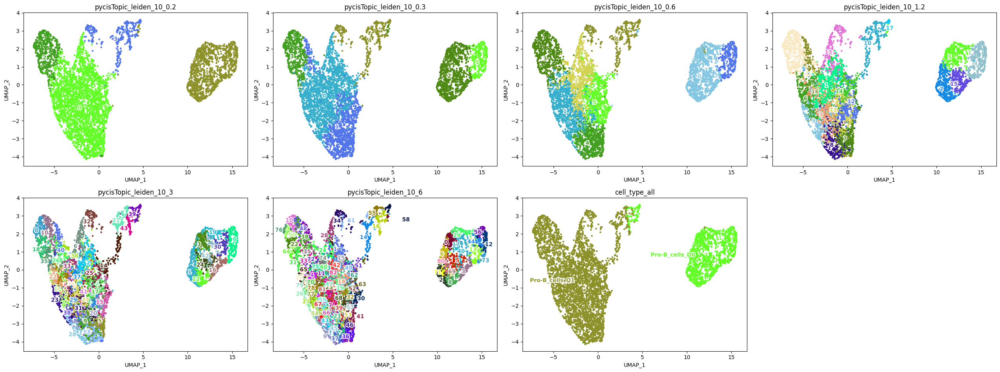

In [23]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['pycisTopic_leiden_10_0.2', 'pycisTopic_leiden_10_0.3','pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3','pycisTopic_leiden_10_6','cell_type_all'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

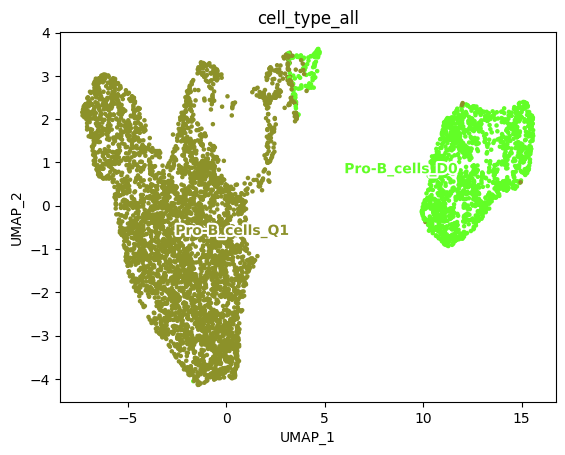

In [24]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type_all'],
    target='cell',
    text_size=10,
    dot_size=5)

In [25]:
cistopic_obj.cell_data['is_nan'] = cistopic_obj.cell_data['cell_type'].isna()
cistopic_obj.cell_data['is_nan'].value_counts()

False    4178
True     2136
Name: is_nan, dtype: int64

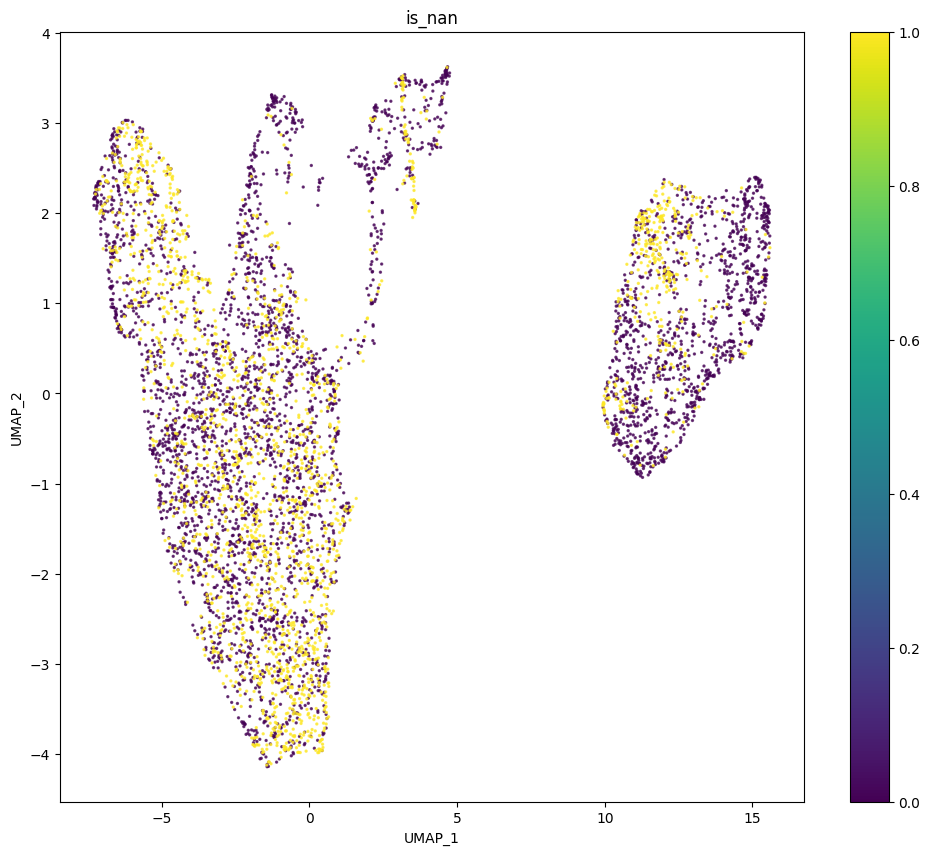

In [26]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['is_nan'],
    remove_nan = False,
    show_label = False,
    target='cell',
    text_size=10,
    dot_size=2,
    alpha = 0.7,
    figsize = (12,10))



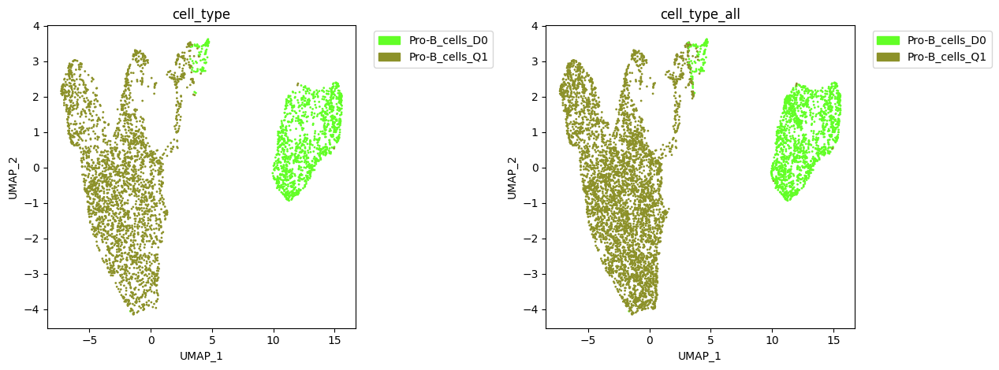

In [27]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type','cell_type_all'],
    target='cell', num_columns=2,
    text_size=3,
    show_label = False,
    show_legend= True,
    dot_size=1)

In [28]:
cistopic_obj.cell_data.cell_type.value_counts()

Pro-B_cells_Q1    2894
Pro-B_cells_D0    1284
Name: cell_type, dtype: int64

In [29]:
cistopic_obj.cell_data.cell_type_all.value_counts()

Pro-B_cells_Q1    4649
Pro-B_cells_D0    1665
Name: cell_type_all, dtype: int64

In [30]:
subset = cistopic_obj.cell_data[cistopic_obj.cell_data['cell_type'].isna()]  # check the predicted cell types
subset

,log10_total_fragments_count,cisTopic_log_nr_frag,pycisTopic_leiden_10_1.2,pdf_values_for_duplication_ratio,barcode,pycisTopic_leiden_10_0.6,log10_unique_fragments_in_peaks_count,duplication_count,cisTopic_nr_frag,cisTopic_nr_acc,...,unique_fragments_count,pdf_values_for_fraction_of_fragments_in_peaks,doublet_outlier,pycisTopic_leiden_10_3,total_fragments_in_peaks_count,pdf_values_for_tss_enrichment,doublets_atac,total_fragments_count,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_6
TTTGGTTAGATATTGG-D0___D0,4.512124,4.259427,4,2.897098,TTTGGTTAGATATTGG,7,4.226291,7046,18173,14566,...,25471,1.766393,False,0,21512,0.032596,False,32517,5,12
TTGTTGAGTTTCTCAT-D0___D0,3.983762,3.761176,2,19.061220,TTGTTGAGTTTCTCAT,0,3.729893,2131,5770,5014,...,7501,2.743905,False,12,6866,0.036074,False,9632,2,71
TACTTCCTCGTGATGG-D0___D0,3.345766,3.096215,5,10.601640,TACTTCCTCGTGATGG,0,3.058805,476,1248,1184,...,1740,2.594680,False,30,1461,0.028750,False,2216,2,17
CTAATGAAGCAAGACT-D0___D0,3.377306,3.120574,10,9.632363,CTAATGAAGCAAGACT,6,3.090258,507,1320,1210,...,1876,2.477805,False,43,1555,0.002737,False,2383,4,16
CTAGGATAGCAGGTAT-D0___D0,3.413467,3.22037,5,0.044934,CTAGGATAGCAGGTAT,0,3.182985,64,1661,1631,...,2526,0.729042,False,19,1557,0.036101,False,2590,2,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCTTATGTCATTTAGC-Q1___Q1,3.273927,3.113943,8,23.520675,GCTTATGTCATTTAGC,5,3.080626,273,1300,1175,...,1605,1.794246,False,4,1415,0.039495,False,1878,1,32
ACTTGCATCCTCAAGC-Q1___Q1,3.343999,3.033021,8,1.309871,ACTTGCATCCTCAAGC,4,3.007321,260,1079,932,...,1947,0.840831,False,28,1161,0.064338,False,2207,1,9
AGTTACCGTAGGATCA-Q1___Q1,3.328583,3.098298,12,22.005376,AGTTACCGTAGGATCA,5,3.067443,331,1254,1168,...,1799,3.543245,False,4,1376,0.067993,False,2130,0,32
CTTCCTCCATAACCGA-Q1___Q1,3.211921,3.047275,1,16.906170,CTTCCTCCATAACCGA,2,3.013680,256,1115,1023,...,1372,1.424823,False,2,1211,0.017699,False,1628,0,42


In [31]:
subset.cell_type_all.value_counts()

Pro-B_cells_Q1    1755
Pro-B_cells_D0     381
Name: cell_type_all, dtype: int64

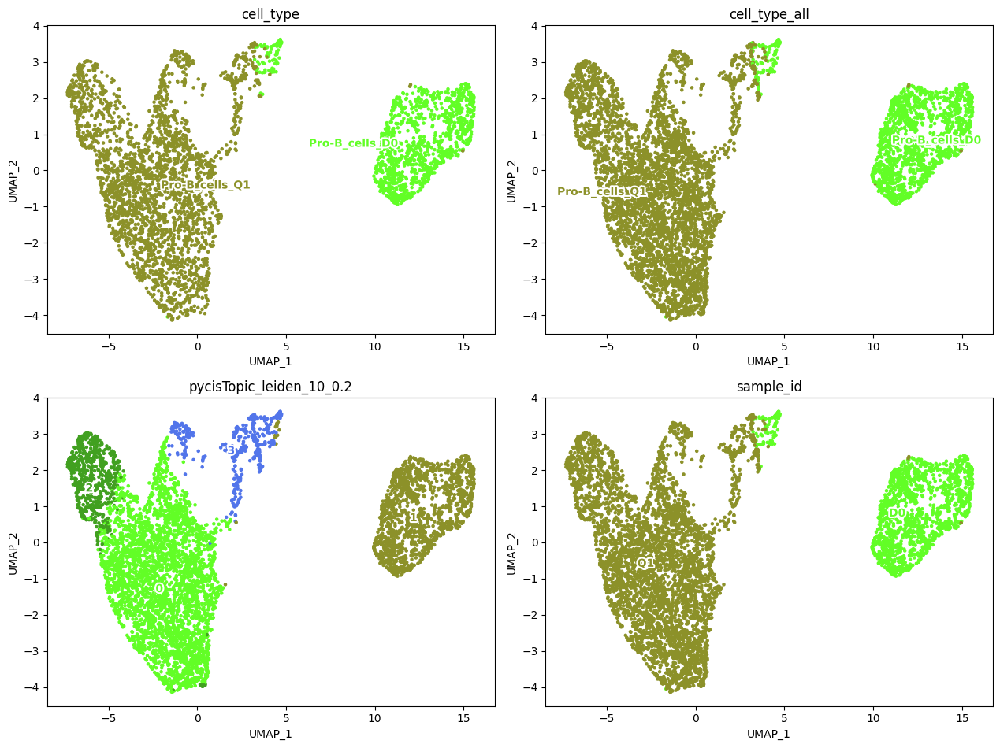

In [32]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type','cell_type_all','pycisTopic_leiden_10_0.2','sample_id'],
    target='cell', num_columns=2,
    text_size=10,
    dot_size=5)

In [33]:
cistopic_obj.cell_data['sample_id'].isna().sum()

0

In [34]:
cistopic_obj.cell_data['cell_type'].isna().sum() # there is  2956 cells that do not have RNA counterpart

2136

In [35]:
cistopic_obj.cell_data

,log10_total_fragments_count,cisTopic_log_nr_frag,pycisTopic_leiden_10_1.2,pdf_values_for_duplication_ratio,barcode,pycisTopic_leiden_10_0.6,log10_unique_fragments_in_peaks_count,duplication_count,cisTopic_nr_frag,cisTopic_nr_acc,...,unique_fragments_count,pdf_values_for_fraction_of_fragments_in_peaks,doublet_outlier,pycisTopic_leiden_10_3,total_fragments_in_peaks_count,pdf_values_for_tss_enrichment,doublets_atac,total_fragments_count,pycisTopic_leiden_10_0.3,pycisTopic_leiden_10_6
CACGGTTTCGTTAGTT-D0___D0,4.021189,3.776047,15,21.064461,CACGGTTTCGTTAGTT,0,3.744684,2353,5971,5172,...,8146,2.605138,False,24,7136,0.046020,False,10499,2,5
AAGTGAACATTGTGAG-D0___D0,4.014479,3.799065,5,20.992568,AAGTGAACATTGTGAG,0,3.762228,2315,6296,5523,...,8023,2.586099,False,19,7451,0.046662,False,10338,2,29
ACAGCACCAAAGGTAA-D0___D0,4.149773,3.912116,15,20.009237,ACAGCACCAAAGGTAA,0,3.879440,3157,8168,7075,...,10960,2.452357,False,42,9740,0.046648,False,14117,2,17
ACCCTTAAGCTTTACG-D0___D0,4.286209,4.014521,10,19.926356,ACCCTTAAGCTTTACG,6,3.980549,4365,10340,8644,...,14963,2.296545,False,39,12338,0.044649,False,19328,4,55
AAACAAGCAGCCAATA-D0___D0,4.608569,4.33644,10,10.304192,AAACAAGCAGCCAATA,6,4.303995,9384,21699,16331,...,31219,1.409776,False,39,26169,0.017207,False,40603,4,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AATCGTTTCTCAAGAA-Q1___Q1,3.385249,3.215109,1,32.307821,AATCGTTTCTCAAGAA,1,3.182700,371,1641,1535,...,2056,2.627678,False,33,1821,0.016111,False,2427,0,78
CTTCCTCCATAACCGA-Q1___Q1,3.211921,3.047275,1,16.906170,CTTCCTCCATAACCGA,2,3.013680,256,1115,1023,...,1372,1.424823,False,2,1211,0.017699,False,1628,0,42
CGGTGTGCATGACTTC-Q1___Q1,3.256958,3.092721,9,11.904044,CGGTGTGCATGACTTC,1,3.064083,247,1238,1151,...,1559,1.937275,False,31,1344,0.035260,False,1806,0,67
ACAGCGGGTGCTTCCT-Q1___Q1,3.254790,3.087781,3,22.265735,ACAGCGGGTGCTTCCT,1,3.054996,278,1224,1127,...,1519,1.769499,False,27,1350,0.021729,False,1797,0,59


In [36]:
# remove NAs in sample_id
cistopic_obj.cell_data['sample_id'] = cistopic_obj.cell_data['sample_id'].fillna(cistopic_obj.cell_data.index.to_series().apply(lambda x: x.split('__')[-1]))
cistopic_obj.cell_data['sample_id'] = cistopic_obj.cell_data['sample_id'].str.replace('_','')
cistopic_obj.cell_data['sample_id'].isna().sum()

0

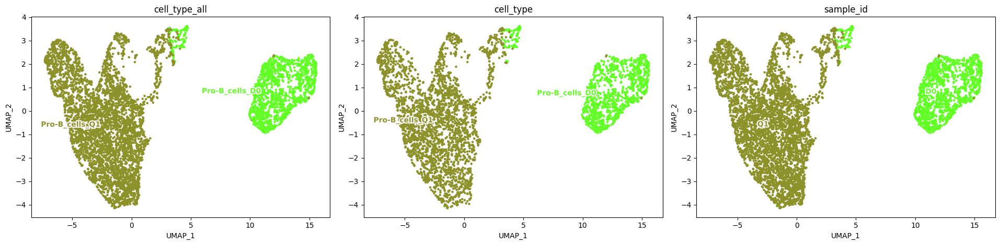

In [37]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type_all','cell_type', 'sample_id'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

In [38]:
cistopic_obj.cell_data.tss_enrichment.max()

36.53718493624718

In [39]:
cistopic_obj.cell_data.tss_enrichment.min()

10.0024834015134

In [40]:
cistopic_obj.cell_data.tss_enrichment.median()

16.12639307948164

In [41]:
cistopic_obj.cell_data.fraction_of_fragments_in_peaks.median()

0.6801073826426725

In [42]:
cistopic_obj.cell_data.log10_unique_fragments_count.median()

3.662757821419417

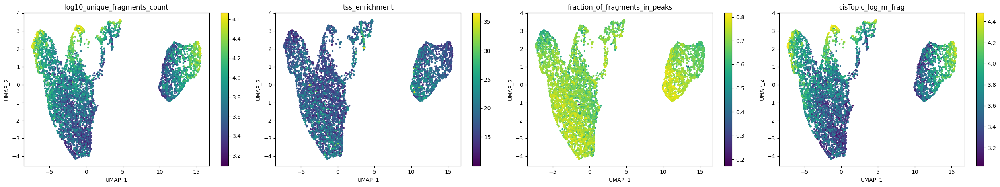

In [43]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['log10_unique_fragments_count', 'tss_enrichment', 'fraction_of_fragments_in_peaks', 'cisTopic_log_nr_frag'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

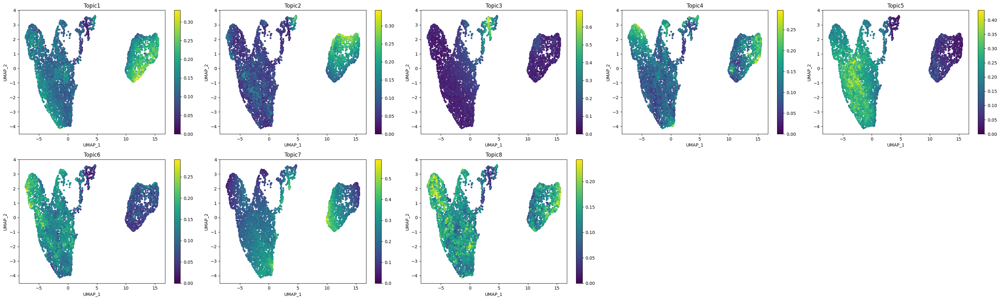

In [44]:
# cell topic contributions- 
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP',
    target = 'cell',
    num_columns=5
)

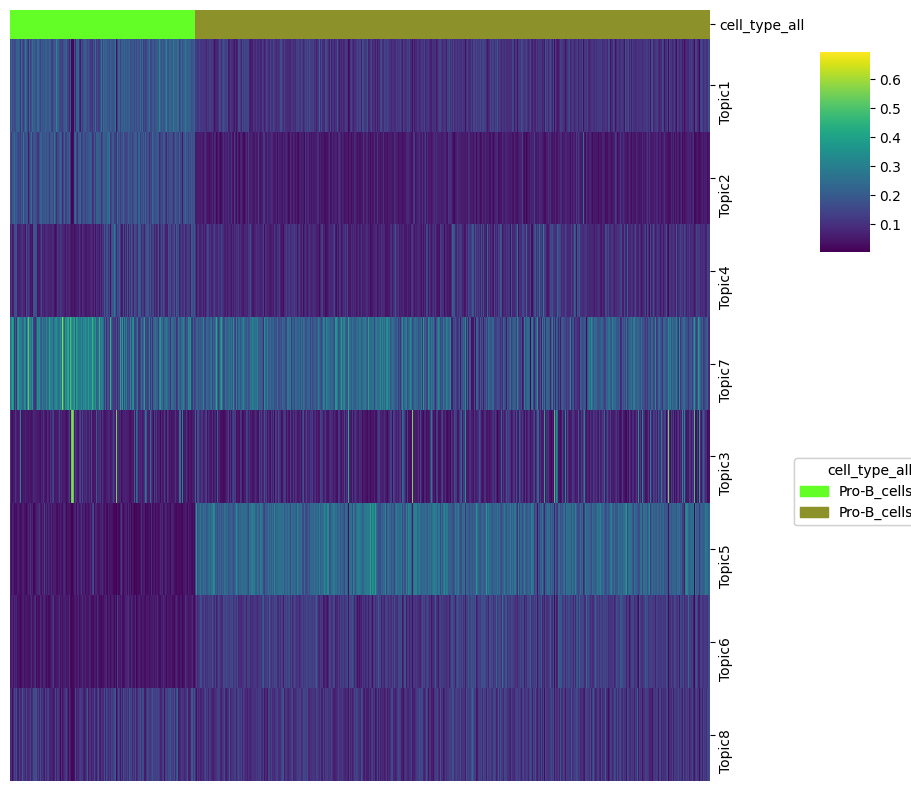

In [45]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['cell_type_all'],
    scale = False,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (10, 10)
)

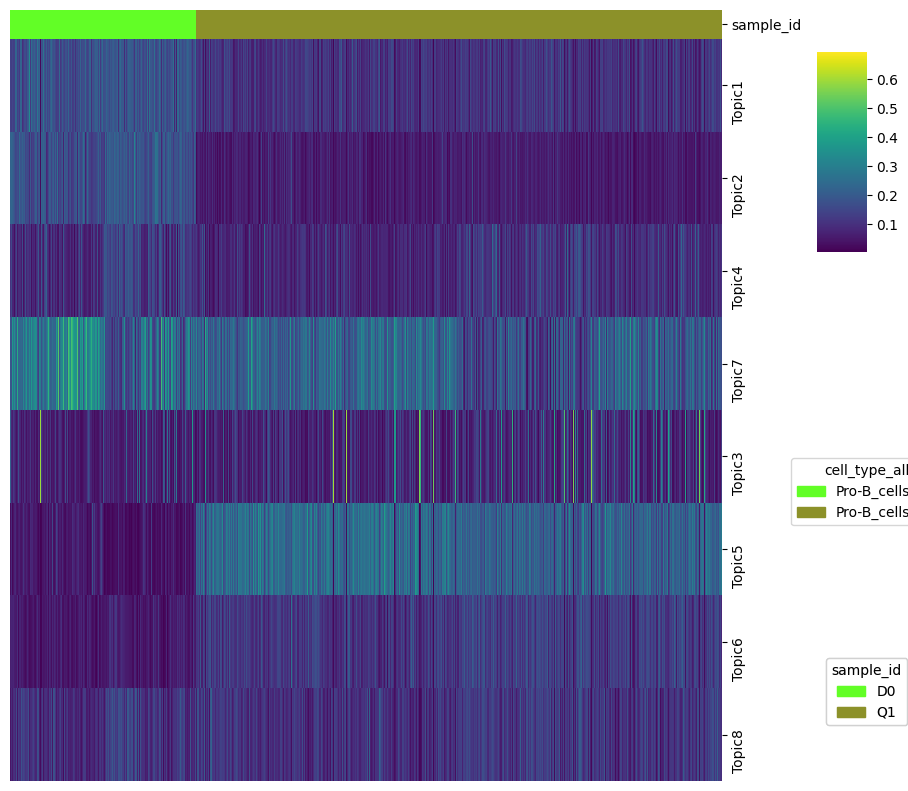

In [46]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['sample_id'],
    scale = False,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (10, 10)
)

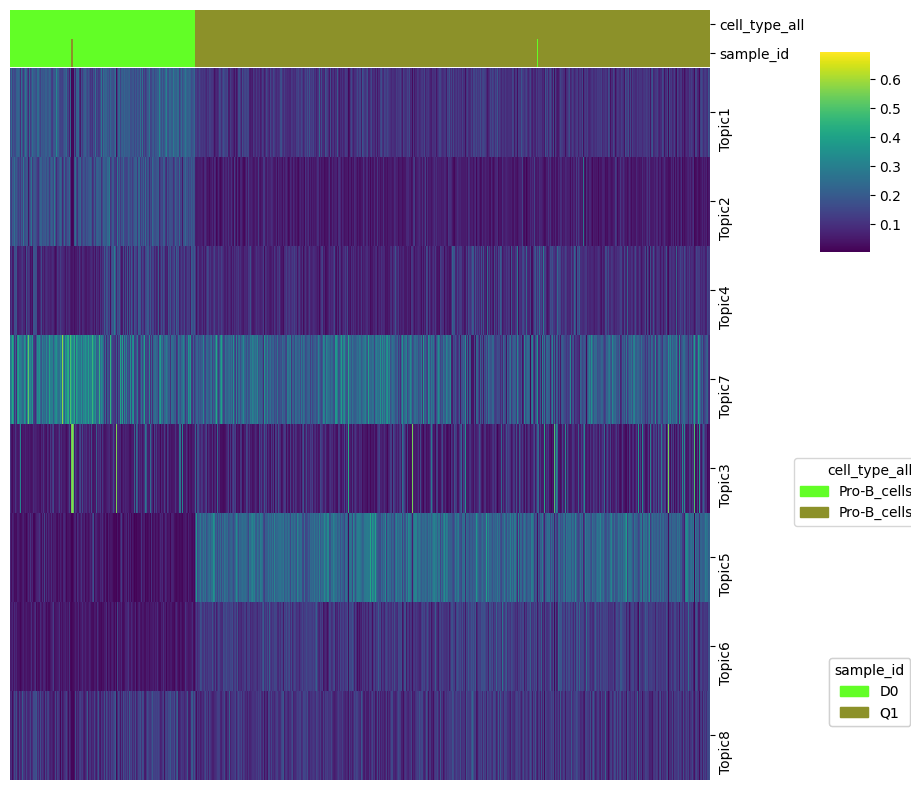

In [47]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['cell_type_all','sample_id'],
    scale = False,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (10, 10)
)

# Topic binarization

In [48]:
from pycisTopic.topic_binarization import binarize_topics

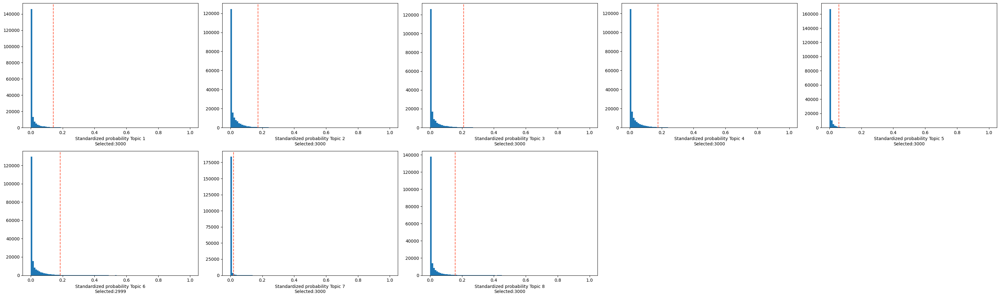

In [49]:
region_bin_topics_top_3k = binarize_topics(
    cistopic_obj, method='ntop', ntop = 3_000,
    plot=True, num_columns=5
)

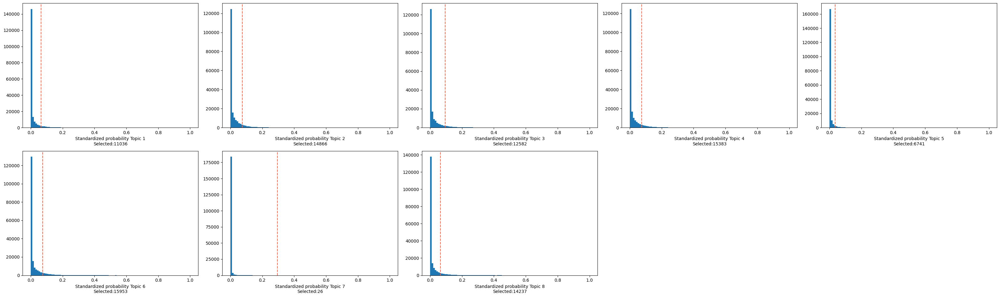

In [50]:
region_bin_topics_otsu = binarize_topics(
    cistopic_obj, method='otsu',
    plot=True, num_columns=5
)

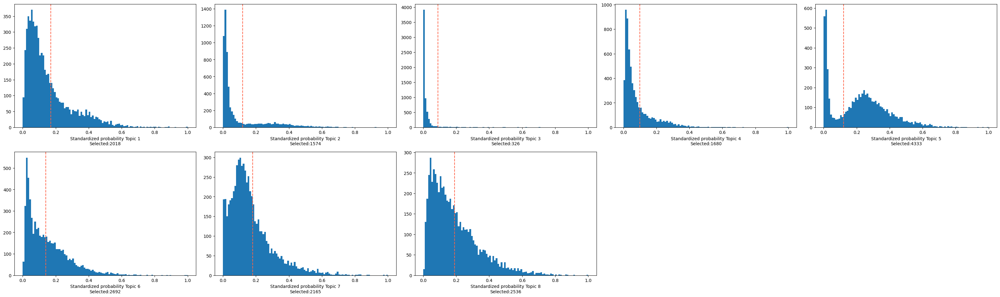

In [51]:
binarized_cell_topic = binarize_topics(
    cistopic_obj,
    target='cell',
    method='li',
    plot=True,
    num_columns=5, nbins=100)

In [52]:
from pycisTopic.topic_qc import compute_topic_metrics, plot_topic_qc, topic_annotation
import matplotlib.pyplot as plt
from pycisTopic.utils import fig2img

In [53]:
topic_qc_metrics = compute_topic_metrics(cistopic_obj)

In [54]:
fig_dict={}
fig_dict['CoherenceVSAssignments']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Log10_Assignments', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['AssignmentsVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Log10_Assignments', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSRegions_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Regions_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSMarginal_dist']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Marginal_topic_dist', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSGini_index']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Gini_index', var_color='Gini_index', plot=False, return_fig=True)

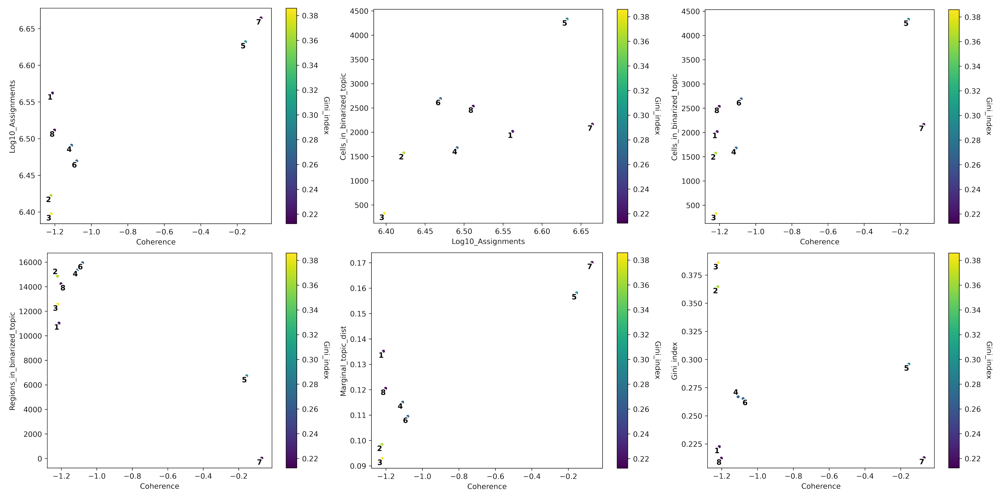

In [55]:
# Plot topic stats in one figure
fig=plt.figure(figsize=(40, 43))
i = 1
for fig_ in fig_dict.keys():
    plt.subplot(2, 3, i)
    img = fig2img(fig_dict[fig_]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0, hspace=-0.70)
plt.show()

Number of assignments

Topic coherence (Mimno et al., 2011): Measures to which extent high scoring regions in the topic are actually co-accessible in the original data. If it is low it indicates that the topic is rather random. The higher, the better is a topic.

The marginal topic distribution: Indicates how much each topic contributes to the model. The higher, the better is a topic.

The gini index: Value between 0 and 1, that indicates the specificity of topics (0: General, 1:Specific)

If topics have been binarized, the number of regions/cells per topic will be added.

# Cell type - topic annotation

In [56]:
topic_annot = topic_annotation(
    cistopic_obj,
    annot_var='cell_type_all',
    binarized_cell_topic=binarized_cell_topic,
    general_topic_thr = 0.2
)

In [57]:
topic_annot

,cell_type_all,Ratio_cells_in_topic,Ratio_group_in_population,is_general
Topic1,Pro-B_cells_D0,0.319607,0.2637,False
Topic2,Pro-B_cells_D0,0.249287,0.2637,False
Topic3,Pro-B_cells_D0,0.051631,0.2637,False
Topic4,Pro-B_cells_D0,0.266075,0.2637,False
Topic5,Pro-B_cells_Q1,0.686253,0.7363,False
Topic6,Pro-B_cells_Q1,0.426354,0.7363,False
Topic7,Pro-B_cells_D0,0.342889,0.2637,False
Topic8,Pro-B_cells_D0,0.401647,0.2637,False


# DAR

In [58]:
from pycisTopic.diff_features import (
    impute_accessibility,
    normalize_scores,
    find_highly_variable_features,
    find_diff_features
)
import numpy as np

In [59]:
imputed_acc_obj = impute_accessibility(
    cistopic_obj,
    selected_cells=None,
    selected_regions=None,
    scale_factor=10**6
)

2025-07-10 15:38:38,222 cisTopic     INFO     Imputing region accessibility
2025-07-10 15:38:38,224 cisTopic     INFO     Impute region accessibility for regions 0-20000
2025-07-10 15:38:38,787 cisTopic     INFO     Impute region accessibility for regions 20000-40000
2025-07-10 15:38:39,341 cisTopic     INFO     Impute region accessibility for regions 40000-60000
2025-07-10 15:38:39,897 cisTopic     INFO     Impute region accessibility for regions 60000-80000
2025-07-10 15:38:40,459 cisTopic     INFO     Impute region accessibility for regions 80000-100000
2025-07-10 15:38:41,023 cisTopic     INFO     Impute region accessibility for regions 100000-120000
2025-07-10 15:38:41,590 cisTopic     INFO     Impute region accessibility for regions 120000-140000
2025-07-10 15:38:42,156 cisTopic     INFO     Impute region accessibility for regions 140000-160000
2025-07-10 15:38:42,713 cisTopic     INFO     Impute region accessibility for regions 160000-180000
2025-07-10 15:38:43,321 cisTopic     

In [60]:
normalized_imputed_acc_obj = normalize_scores(imputed_acc_obj, scale_factor=10**4)

2025-07-10 15:38:43,644 cisTopic     INFO     Normalizing imputed data
2025-07-10 15:38:48,805 cisTopic     INFO     Done!


2025-07-10 15:38:48,815 cisTopic     INFO     Calculating mean
2025-07-10 15:38:49,874 cisTopic     INFO     Calculating variance


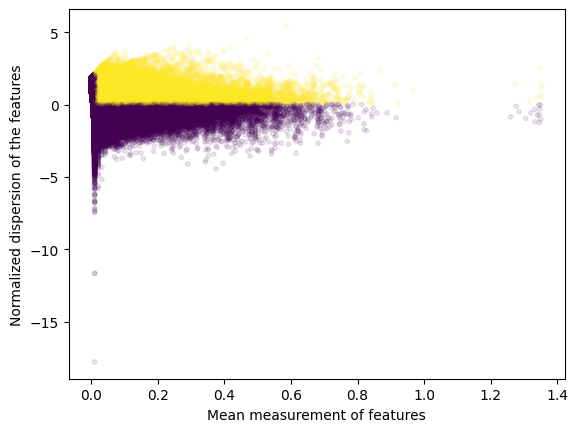

2025-07-10 15:39:00,209 cisTopic     INFO     Done!


In [61]:
variable_regions = find_highly_variable_features(
    normalized_imputed_acc_obj,
    min_disp = 0.05,
    min_mean = 0.0125,
    max_mean = 3,
    max_disp = np.inf,
    n_bins=20,
    n_top_features=None,
    plot=True
)

In [62]:
len(variable_regions)

34157

In [ ]:
markers_dict= find_diff_features(
    cistopic_obj,
    imputed_acc_obj,
    variable='cell_type_all',
    var_features=variable_regions,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=5,
    _temp_dir='/ray_spill',
    split_pattern = '-'
)

2025-07-10 15:39:04,636	INFO worker.py:1724 -- Started a local Ray instance.


2025-07-10 15:39:06,069 cisTopic     INFO     Subsetting data for Pro-B_cells_D0 (1665 of 6314)
2025-07-10 15:39:10,874 cisTopic     INFO     Computing p-value for Pro-B_cells_D0
2025-07-10 15:39:17,905 cisTopic     INFO     Computing log2FC for Pro-B_cells_D0
2025-07-10 15:39:19,880 cisTopic     INFO     Pro-B_cells_D0 done!
2025-07-10 15:39:19,886 cisTopic     INFO     Subsetting data for Pro-B_cells_Q1 (4649 of 6314)
2025-07-10 15:39:20,106 cisTopic     INFO     Computing p-value for Pro-B_cells_Q1
2025-07-10 15:39:25,959 cisTopic     INFO     Computing log2FC for Pro-B_cells_Q1
2025-07-10 15:39:26,069 cisTopic     INFO     Pro-B_cells_Q1 done!


In [64]:
from pycisTopic.clust_vis import plot_imputed_features

In [65]:
cistopic_obj.cell_data.cell_type_all.value_counts()

Pro-B_cells_Q1    4649
Pro-B_cells_D0    1665
Name: cell_type_all, dtype: int64

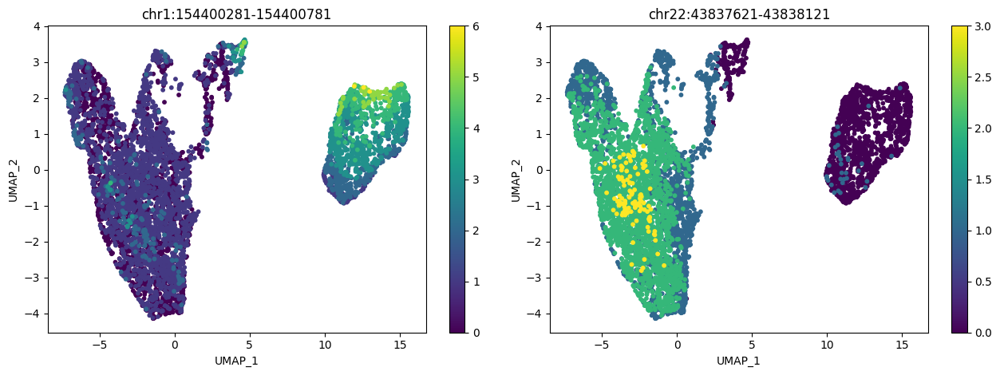

In [66]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=imputed_acc_obj,
    features=[markers_dict[x].index.tolist()[0] for x in ['Pro-B_cells_D0','Pro-B_cells_Q1']],
    scale=False,
    num_columns=4
)

In [67]:
print("Number of DARs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(markers_dict[x])}")

Number of DARs found:
---------------------
  Pro-B_cells_D0: 8509
  Pro-B_cells_Q1: 8718


In [68]:
df_d0 = markers_dict['Pro-B_cells_D0']

In [69]:
#df_d0['chr'] = 
df_d0['chr'] = df_d0.index.str.split(':').str[0]
df_d0['loc'] = df_d0.index.str.split('-').str[1]
df_d0_chr7 = df_d0[df_d0['chr'] == 'chr7']
df_d0_chr7['loc'] = df_d0_chr7['loc'].astype(int)
df_d0_chr7_sorted = df_d0_chr7.sort_values(by='loc')
df_d0_chr7_sorted

,Log2FC,Adjusted_pval,Contrast,chr,loc
chr7:89228-89728,1.200849,0.0,Pro-B_cells_D0,chr7,89728
chr7:119226-119726,1.044901,0.0,Pro-B_cells_D0,chr7,119726
chr7:150042-150542,0.605543,0.0,Pro-B_cells_D0,chr7,150542
chr7:191230-191730,1.582928,0.0,Pro-B_cells_D0,chr7,191730
chr7:192066-192566,0.754727,0.0,Pro-B_cells_D0,chr7,192566
...,...,...,...,...,...
chr7:150340493-150340993,1.153626,0.0,Pro-B_cells_D0,chr7,150340993
chr7:150365981-150366481,1.349586,0.0,Pro-B_cells_D0,chr7,150366481
chr7:150435560-150436060,0.901510,0.0,Pro-B_cells_D0,chr7,150436060
chr7:151115889-151116389,1.280482,0.0,Pro-B_cells_D0,chr7,151116389


In [70]:
df_d0_chr7_sorted.to_csv('chr7_d0_dars.csv')

In [71]:
df_d0_chr7_sorted["Adjusted_pval"].max()

2.922085285922599e-108

In [72]:
df_d0_chr7_sorted["Adjusted_pval"].min()

0.0

<AxesSubplot: >

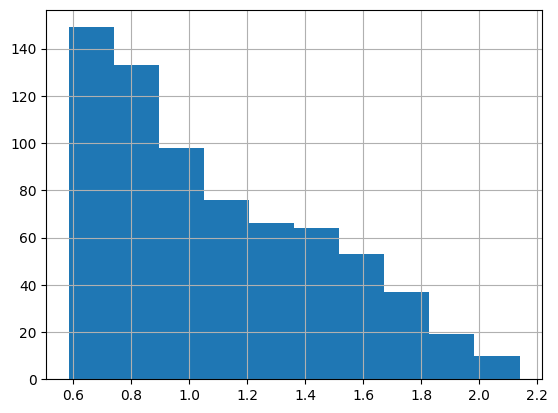

In [73]:
df_d0_chr7_sorted["Log2FC"].hist()

Text(0.5, 0, 'location along chr7 (bps)')

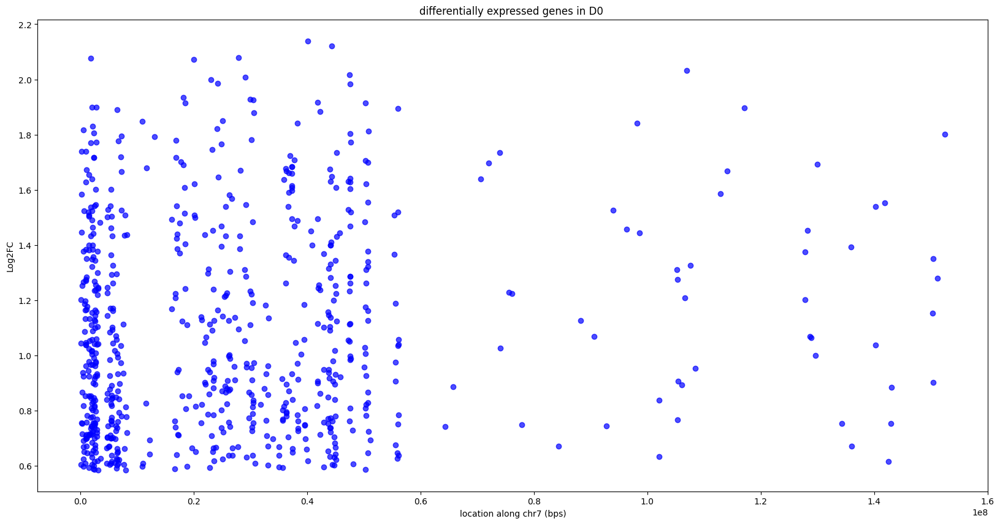

In [ ]:
plt.figure(figsize=(20,10)) 
plt.scatter(x=df_d0_chr7_sorted["loc"], y=df_d0_chr7_sorted["Log2FC"], color='blue', alpha=0.7)
plt.title("differentially expressed genes in D0 ")
plt.ylabel("Log2FC")
plt.xlabel("location along chr7 (bps)")

In [75]:
df_q1 = markers_dict['Pro-B_cells_Q1']
df_q1['chr'] = df_q1.index.str.split(':').str[0]
df_q1['loc'] = df_q1.index.str.split('-').str[1]
df_q1_chr7 = df_q1[df_q1['chr'] == 'chr7']
df_q1_chr7['loc'] = df_q1_chr7['loc'].astype(int)
df_q1_chr7_sorted = df_q1_chr7.sort_values(by='loc')
df_q1_chr7_sorted

,Log2FC,Adjusted_pval,Contrast,chr,loc
chr7:525657-526157,0.743300,0.0,Pro-B_cells_Q1,chr7,526157
chr7:573385-573885,2.181254,0.0,Pro-B_cells_Q1,chr7,573885
chr7:574107-574607,2.076699,0.0,Pro-B_cells_Q1,chr7,574607
chr7:575012-575512,2.414982,0.0,Pro-B_cells_Q1,chr7,575512
chr7:823201-823701,1.263832,0.0,Pro-B_cells_Q1,chr7,823701
...,...,...,...,...,...
chr7:159175148-159175648,2.715925,0.0,Pro-B_cells_Q1,chr7,159175648
chr7:159191289-159191789,2.781817,0.0,Pro-B_cells_Q1,chr7,159191789
chr7:159195721-159196221,2.130146,0.0,Pro-B_cells_Q1,chr7,159196221
chr7:159197201-159197701,2.269944,0.0,Pro-B_cells_Q1,chr7,159197701


In [76]:
df_q1_chr7_sorted.to_csv('chr7_q1_dars.csv')

Text(0.5, 0, 'location along chr7 (bps)')

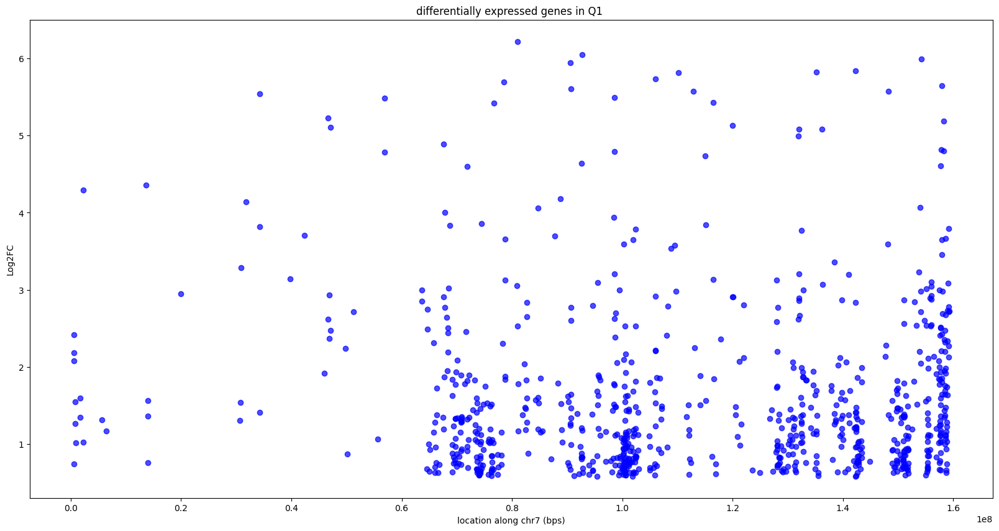

In [ ]:
plt.figure(figsize=(20,10)) 
plt.scatter(x=df_q1_chr7_sorted["loc"], y=df_q1_chr7_sorted["Log2FC"], color='blue', alpha=0.7)
plt.title("differentially expressed genes in Q1 ")
plt.ylabel("Log2FC")
plt.xlabel("location along chr7 (bps)")

In [78]:
# save region sets
os.makedirs(os.path.join(out_dir, "region_sets"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_otsu"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_top_3k"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "DARs_cell_type"), exist_ok = True)

In [79]:
from pycisTopic.utils import region_names_to_coordinates

In [80]:
for topic in region_bin_topics_otsu:
    region_names_to_coordinates(
        region_bin_topics_otsu[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_otsu", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [81]:
for topic in region_bin_topics_top_3k:
    region_names_to_coordinates(
        region_bin_topics_top_3k[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_top_3k", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [82]:
for cell_type in markers_dict:
    region_names_to_coordinates(
        markers_dict[cell_type].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "DARs_cell_type", f"{cell_type}.bed"),
        sep = "\t",
        header = False, index = False
    )

# Gene activity

In [83]:
import pyranges as pr
from pycisTopic.gene_activity import get_gene_activity

In [ ]:
chromsizes = pd.read_table(os.path.join("../outs", "qc", "hg38.chrom_sizes_and_alias.tsv")) # you may need to adjust this path
chromsizes

,# ucsc,length,ensembl,refseq_id,genbank_id
0,chr1,248956422,1,NC_000001.11,CM000663.2
1,chr2,242193529,2,NC_000002.12,CM000664.2
2,chr3,198295559,3,NC_000003.12,CM000665.2
3,chr4,190214555,4,NC_000004.12,CM000666.2
4,chr5,181538259,5,NC_000005.10,CM000667.2
...,...,...,...,...,...
449,chrUn_KI270539v1,993,HSCHRUN_RANDOM_146,NT_187442.1,KI270539.1
450,chrUn_KI270385v1,990,HSCHRUN_RANDOM_195,NT_187487.1,KI270385.1
451,chrUn_KI270423v1,981,HSCHRUN_RANDOM_121,NT_187417.1,KI270423.1
452,chrUn_KI270392v1,971,HSCHRUN_RANDOM_193,NT_187485.1,KI270392.1


In [85]:
chromsizes.rename({"# ucsc": "Chromosome", "length": "End"}, axis = 1, inplace = True)
chromsizes["Start"] = 0
chromsizes = pr.PyRanges(chromsizes[["Chromosome", "Start", "End"]])

In [ ]:
pr_annotation = pd.read_table(
        os.path.join("../outs", "qc", "tss.bed")
    ).rename(
        {"Name": "Gene", "# Chromosome": "Chromosome"}, axis = 1)
pr_annotation["Transcription_Start_Site"] = pr_annotation["Start"]
pr_annotation = pr.PyRanges(pr_annotation)
pr_annotation

,Chromosome,Start,End,Gene,Score,Strand,Transcript_type,Transcription_Start_Site
0,GL000009.2,58375,58376,NaN,.,-,protein_coding,58375
1,GL000194.1,115017,115018,NaN,.,-,protein_coding,115017
2,GL000194.1,115054,115055,MAFIP,.,-,protein_coding,115054
3,GL000195.1,49163,49164,NaN,.,-,protein_coding,49163
4,GL000213.1,139654,139655,NaN,.,-,protein_coding,139654
...,...,...,...,...,...,...,...,...
87556,chrY,6911751,6911752,AMELY,.,-,protein_coding,6911751
87557,chrY,6872607,6872608,AMELY,.,-,protein_coding,6872607
87558,chrY,21918031,21918032,RBMY1E,.,-,protein_coding,21918031
87559,chrY,24047968,24047969,CDY1B,.,-,protein_coding,24047968


In [87]:
gene_act, weigths = get_gene_activity(
    imputed_acc_obj,
    pr_annotation,
    chromsizes,
    use_gene_boundaries=True, # Whether to use the whole search space or stop when encountering another gene
    upstream=[1000, 100000], # Search space upstream. The minimum means that even if there is a gene right next to it
                             # these bp will be taken (1kbp here)
    downstream=[1000,100000], # Search space downstream
    distance_weight=True, # Whether to add a distance weight (an exponential function, the weight will decrease with distance)
    decay_rate=1, # Exponent for the distance exponential funciton (the higher the faster will be the decrease)
    extend_gene_body_upstream=10000, # Number of bp upstream immune to the distance weight (their value will be maximum for
                          #this weight)
    extend_gene_body_downstream=500, # Number of bp downstream immune to the distance weight
    gene_size_weight=False, # Whether to add a weights based on the length of the gene
    gene_size_scale_factor='median', # Dividend to calculate the gene size weigth. Default is the median value of all genes
                          #in the genome
    remove_promoters=False, # Whether to remove promoters when computing gene activity scores
    average_scores=True, # Whether to divide by the total number of region assigned to a gene when calculating the gene
                          #activity score
    scale_factor=1, # Value to multiply for the final gene activity matrix
    extend_tss=[10,10], # Space to consider a promoter
    gini_weight = True, # Whether to add a gini index weigth. The more unique the region is, the higher this weight will be
    return_weights= True, # Whether to return the final weights
    project='Gene_activity') # Project name for the gene activity object

2025-07-10 15:40:40,619 cisTopic     INFO     Calculating gene boundaries
2025-07-10 15:40:57,344 cisTopic     INFO     Calculating distances


join: Strand data from other will be added as strand data to self.
If this is undesired use the flag apply_strand_suffix=False.
To turn off the warning set apply_strand_suffix to True or False.


2025-07-10 15:41:06,305 cisTopic     INFO     Calculating distance weigths
2025-07-10 15:41:06,844 cisTopic     INFO     Distance weights done
2025-07-10 15:41:06,845 cisTopic     INFO     Calculating gini weights
2025-07-10 15:41:18,355 cisTopic     INFO     Getting gene activity scores
2025-07-10 15:43:30,829 cisTopic     INFO     Creating imputed features object


In [ ]:
DAG_markers_dict= find_diff_features(
    cistopic_obj,
    gene_act,
    variable='cell_type_all',
    var_features=None,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=15,
    _temp_dir='/ray_spill',
    split_pattern = '-')

2025-07-10 15:43:34,921	INFO worker.py:1724 -- Started a local Ray instance.


2025-07-10 15:43:38,387 cisTopic     INFO     Subsetting data for Pro-B_cells_D0 (1665 of 6314)
2025-07-10 15:43:41,218 cisTopic     INFO     Computing p-value for Pro-B_cells_D0
2025-07-10 15:43:45,216 cisTopic     INFO     Computing log2FC for Pro-B_cells_D0
2025-07-10 15:43:46,853 cisTopic     INFO     Pro-B_cells_D0 done!
2025-07-10 15:43:46,858 cisTopic     INFO     Subsetting data for Pro-B_cells_Q1 (4649 of 6314)
2025-07-10 15:43:47,103 cisTopic     INFO     Computing p-value for Pro-B_cells_Q1
2025-07-10 15:43:49,824 cisTopic     INFO     Computing log2FC for Pro-B_cells_Q1
2025-07-10 15:43:49,915 cisTopic     INFO     Pro-B_cells_Q1 done!


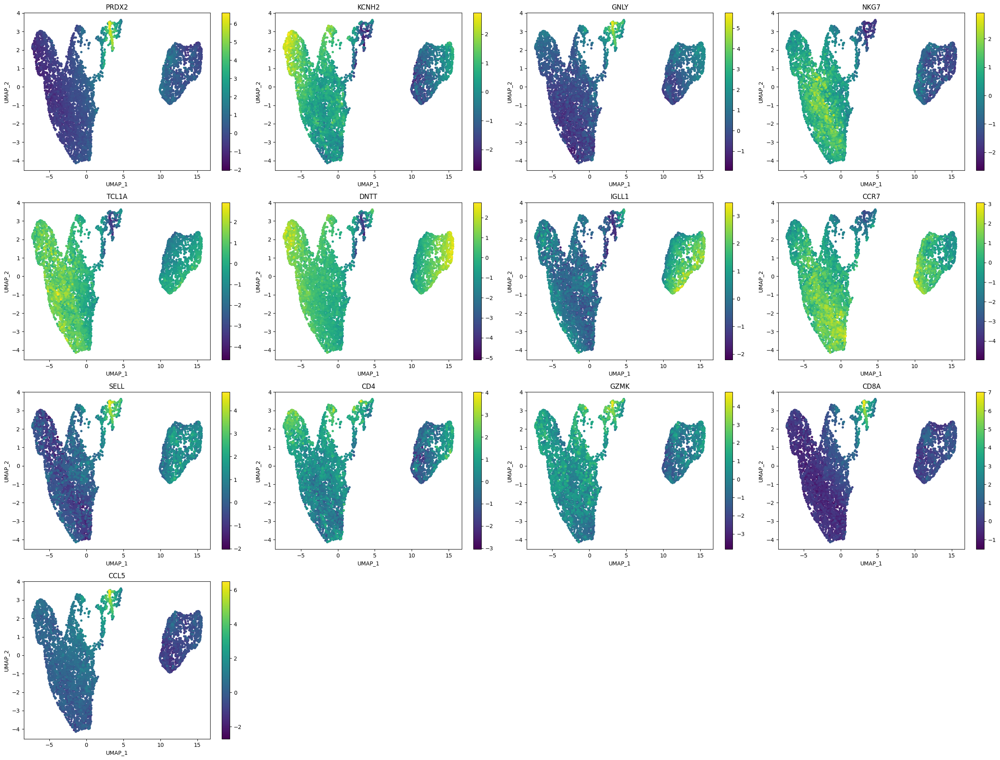

In [90]:
# cell typist
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=[
        'PRDX2','KCNH2', # Mid erythroid
        'GNLY','NKG7', # CD16+ NK cells
        'TCL1A', # naive B cells
        'DNTT','IGLL1', # Pro-B cells
        'CCR7','SELL','CD4', # Tcm/Naive helper T cells
        'GZMK','CD8A','CCL5'], # Tem/Trm cytotoxic T cells
    scale=True,
    num_columns=4
)


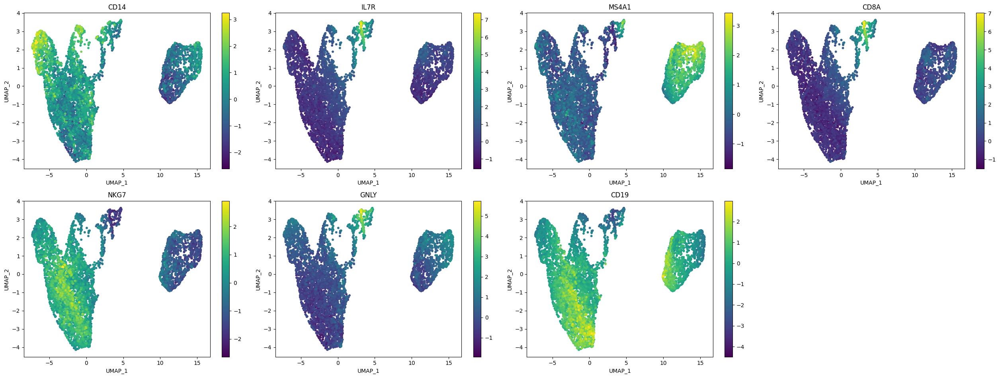

In [91]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=['CD14', # CD14 mono
              'IL7R', # CD4
              'MS4A1', # B
              'CD8A',  #CD8+T
              'NKG7','GNLY', #NK
              'CD19'], #CD19 B-all
    scale=True,
    num_columns=4
)

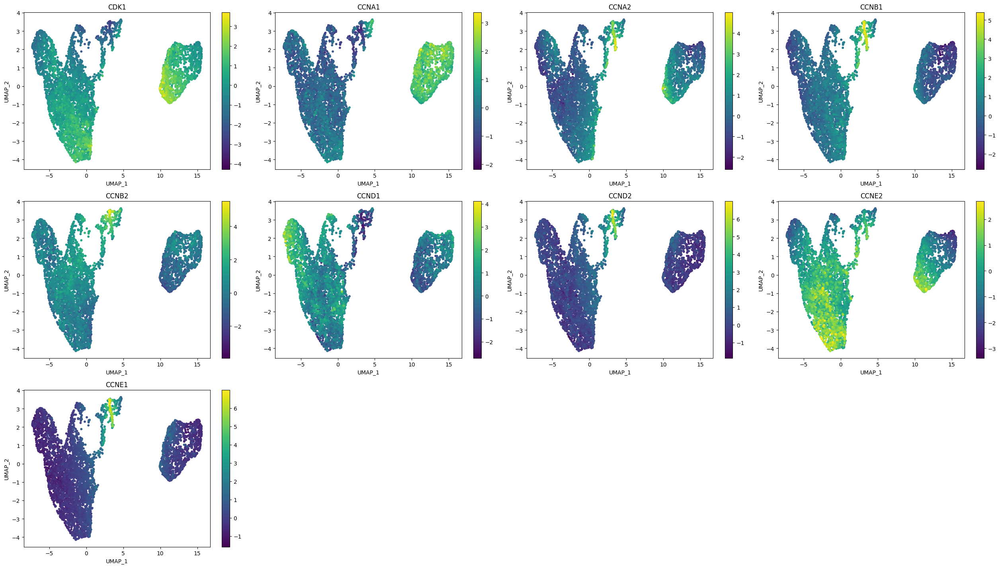

In [92]:
# cell cycle
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features=['CDK1',
              'CCNA1','CCNA2',
              'CCNB1','CCNB2',
              'CCND1','CCND2',
              'CCNE2','CCNE1'],
    scale=True,
    num_columns=4
)

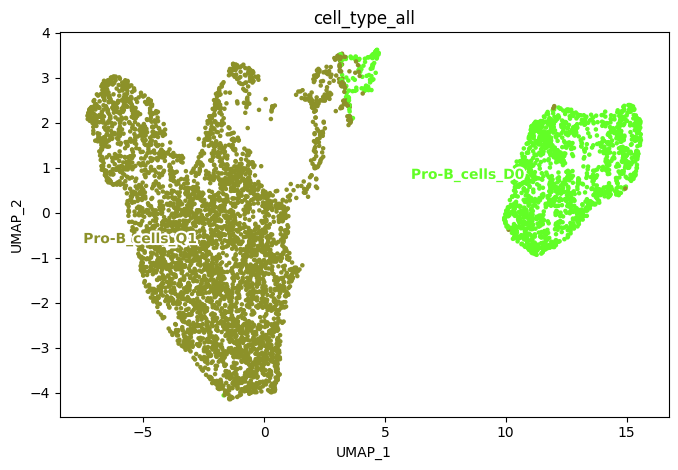

In [93]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['cell_type_all'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

In [94]:
print("Number of DAGs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(DAG_markers_dict[x])}")

Number of DAGs found:
---------------------
  Pro-B_cells_D0: 841
  Pro-B_cells_Q1: 998


In [95]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "subset_cistopic_obj_all_info.pkl"), "wb")
)

In [96]:
DAG_markers_dict.keys()

dict_keys(['Pro-B_cells_D0', 'Pro-B_cells_Q1'])

In [97]:
D0_genes = DAG_markers_dict['Pro-B_cells_D0'].index.tolist()


with open('D0_DAG.txt', 'w') as f:
    for item in D0_genes:
        f.write(f"{item}\n")

In [98]:
D0_genes = DAG_markers_dict['Pro-B_cells_Q1'].index.tolist()


with open('Q1_DAG.txt', 'w') as f:
    for item in D0_genes:
        f.write(f"{item}\n")

In [109]:
pip list

Package                              Version
------------------------------------ -----------------
adjustText                           1.0.4
aiohttp                              3.9.3
aiosignal                            1.3.1
anndata                              0.10.5.post1
annoy                                1.17.3
appdirs                              1.4.4
arboreto                             0.1.6
argparse-dataclass                   2.0.0
array_api_compat                     1.5.1
asttokens                            2.4.1
attr                                 0.3.2
attrs                                23.2.0
bbknn                                1.6.0
beautifulsoup4                       4.12.3
bidict                               0.23.1
bioservices                          1.11.2
blosc2                               2.5.1
bokeh                                3.4.0
boltons                              23.1.1
bs4                                  0.0.2
cattrs                     